# Исследование рынка заведений общественного питания Москвы

Инвесторы фонда решили попробовать себя в новой области и открыть заведение общественного питания в Москве.\
Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Описание проекта**

В рамках исследования нас просят изучить рынок Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных**

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:\
«Средний счёт: 1000–1500 ₽»; «Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽» и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:\
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:\
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):\
0 — заведение не является сетевым\
1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

1. [Открытие данных](#part_1)
    * [Импорт библиотек](#import)
    * [Загрузка данных и изучение общей информации](#loading)
2. [Предобработка данных](#prepared)
    * [Изменение типа данных](#change_type)
    * [Проверка и обработка дубликатов](#check_duplicates)
    * [Добавление столбцов с категориальными данными](#add_categories)
3. [Анализ данных](#data_analysis)
    * [Количество объектов общественного питания по категориям](#category_counts)
    * [Количество посадочных мест в местах по категориям](#category_seats)
    * [Соотношение сетевых и несетевых заведений](#chain_ratio)
    * [Какие категории заведений чаще являются сетевыми](#percent_chain)
    * [Топ-15 популярных сетей в Москве](#top15_chain)
    * [Какие административные районы Москвы присутствуют в данных](#districts)
    * [Распределение средних рейтингов по категориям заведений](#rating)
    * [Фоновая картограмма со средним рейтингом заведений каждого района](#map_mean_rating)
    * [Картограмма со всеми заведениями общепита на карте](#map_all_objects)
    * [Топ-15 улиц по количеству заведений](#top_streets)
    * [Улицы, на которых находится только один объект общепита](#street_1)
    * [Построим фоновую картограмму с медианным средним чеком для каждого района](#map_mean_bill)
    * [Вывод](#result)
4. [Детализация исследования: открытие кофейни](#coffee_open)
    * [Cколько всего кофеен по Москве](#count_coffee)
    * [Есть ли круглосуточные кофейни?](#coffee_daynight)
    * [Распределение рейтингов по районам](#coffee_rating)
    * [На какую стоимость чашки капучино стоит ориентироваться при открытии?](#coffee_cup)
    * [Вывод](#coffee_result)


## Открытие данных <a id="part_1"></a> 

### Импорт библиотек<a id="import"></a> 

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go

### Загрузка данных и изучение общей информации<a id="loading"></a> 

In [2]:
data = pd.read_csv('/moscow_places.csv')

In [3]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

# задаём общий стиль для графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":200, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

# выведем основную информацию о данных
display(data.info())
display(data.describe())
data.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
59,Хинкали Gали!,кафе,"Москва, Абрамцевская улица, 30, стр. 1",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.906281,37.576517,4.7,NaN,NaN,NaN,NaN,0,240.0
6454,Шоти,кафе,"Москва, Большая Косинская улица, 27, стр. 9",Восточный административный округ,"ежедневно, 09:00–22:00",55.717469,37.857870,3.5,NaN,NaN,NaN,NaN,1,NaN
4803,Coffeeshop Company,кофейня,"Москва, улица Маши Порываевой, 34",Центральный административный округ,"пн-пт 07:30–22:00; сб,вс 11:00–21:00",55.771796,37.649003,4.1,NaN,NaN,NaN,NaN,1,56.0
5382,Шаурмовский,ресторан,"Москва, улица Сталеваров, 3Лс7",Восточный административный округ,"ежедневно, круглосуточно",55.757543,37.841863,4.4,NaN,NaN,NaN,NaN,0,NaN
4531,Pho U,кафе,"Москва, Ладожская улица, 7",Центральный административный округ,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",55.771540,37.682283,4.4,средние,Средний счёт:300–500 ₽,400.0,NaN,1,10.0


**Промежуточный итог**

В нашем распоряжении информация о 8406 заведениях общественного питания города Москвы.\
Картографические данные, а также тип заведения, рейтинг и индикатор сетевого общепита - не имеют пропусков.\
Есть пропуски по показателям: название заведения, режим работы, информация о ценах и посадочных местах - такие пропуски не сильно скажутся на проведении исследования, оставим данные как есть.

В рамках предобработки проверим наличие дубликатов, изменим тип данных и добавим новые столбцы, которые пригодятся для исследования.

## Предобработка данных<a id="prepared"></a> 

### Изменение типа данных<a id="change_type"></a> 

In [4]:
# исправим тип данных в столбце с индикатором сетевых заведений
data['chain'] = data['chain'] == 1

### Проверка и обработка дубликатов<a id="check_duplicates"></a> 

In [5]:
# переведём название заведений к нижнему регистру и уберём крайние пробелы для поиска неявных дубликатов
data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.strip()

# выведем список уникальных сетевых названий и бегло поищем неявные дубликаты
words = data.loc[data['chain'] == True, 'name'].unique()
words.sort()
words

array(['1-я креветочная', '10 идеальных пицц', '18 грамм', '4 сезона',
       '7 сэндвичей', '8 вафель', '9 bar coffee', 'abc coffee roasters',
       'air coffee', 'americano black coffee & food', 'arabix',
       'arcus bar and food', 'asia gourmet', 'bakery', 'bb&burgers',
       'bfl’s', 'bigсуши', 'black star burger', 'bodrero', 'bon lavash',
       'boston seafood & bar', 'bowl family', 'brasserie lambic', 'bro&n',
       'brooms', 'burger club', 'burger heroes', 'bổ', 'cafe', 'cafe inn',
       'café de paris', 'camera obscura', 'camorra pizza e birra',
       'campus', 'cassette cafe', 'chicha san chen', 'chicko', 'cinnabon',
       'city life', 'cofefest', 'coffee and the city', 'coffee bean',
       'coffee break', 'coffee guru', 'coffee in', 'coffee like',
       'coffee moose', 'coffee music', 'coffee party', 'coffee point',
       'coffee way', "coffeebar'17", 'coffeebrain', "coffeekaldi's",
       'coffeeshop company', 'coffeeshots', 'coffeesphere', 'coffprice',
       'c

Есть неявный дубль у Яндекс.Лавки: один указан через точку, а другой вариант - через пробел.\
Также возможны ошибки из-за № и дефисов, которые окружены пробелами - обработаем символы и посмотрим сколько дубликатов пропадёт.

In [6]:
print('Количество уникальных названий в сетевых заведениях до изменений:', data.loc[data['chain'] == True, 'name'].nunique())

data.loc[data['chain'] == True, 'name'] = data.loc[data['chain'] == True, 'name'].str.replace('№ ', '№')
data.loc[data['chain'] == True, 'name'] = data.loc[data['chain'] == True, 'name'].str.replace(' - ', '-')
data.loc[data['chain'] == True, 'name'] = data.loc[data['chain'] == True, 'name'].str.replace('яндекс лавка', 'яндекс.лавка')


print('Количество уникальных названий в сетевых заведениях после изменений:', data.loc[data['chain'] == True, 'name'].nunique())

Количество уникальных названий в сетевых заведениях до изменений: 747
Количество уникальных названий в сетевых заведениях после изменений: 744


In [7]:
# проверим количество дубликатов по имени и адресу заведения
data.loc[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,False,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,True,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276.0


Обнаружены дубликаты по имени и адресу заведения.\
`more poke` и `раковарня клешни и хвосты` согласно информации с интернета - сетевые заведения, а `хлеб да выпечка` - нет.\
Удалим по одному из дубликатов, где информация менее полная.\
Заодно проверим есть ли полные дубликаты в таблице.

In [8]:
data = data.drop(index= [1430, 2420, 3109])
data.reset_index(drop=True)

# посчитаем количество явных дубликатов в таблице
display(data.duplicated().sum())

0

### Добавление столбцов с категориальными данными<a id="add_categories"></a> 

#### Добавим колонку с названием улицы.

In [9]:
data['street'] = data['address'].str.split(', ').str[1]

#### Добавим столбец с информацией о графике работы заведений - 24/7 или нет.

In [10]:
data['24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   bool   
 13  seats              4792 non-null   float64
 14  street             8403 non-null   object 
 15  24/7               8403 non-null   bool   
dtypes: bool(2), float64(6), 

#### Промежуточный итог
Данные подготовили - переходим к анализу данных.

## Анализ данных<a id="data_analysis"></a> 

### Исследуем количество объектов общественного питания по категориям<a id="category_counts"></a> 

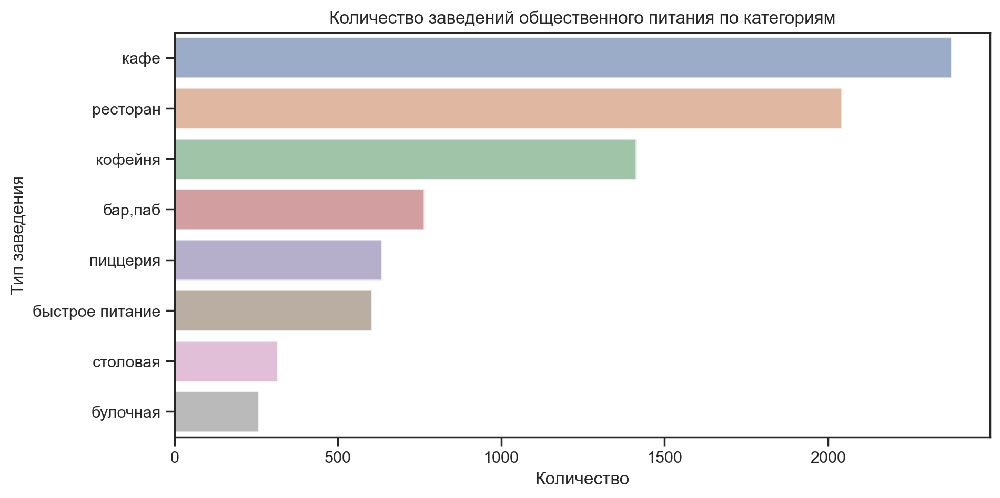

In [12]:
data_category = (
    data
    .groupby('category', as_index=False)
    .agg(count=('name', 'count'))
    .sort_values('count', ascending=False)
)

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='count', y='category', data=data_category, alpha=0.6)
ax.set_title('Количество заведений общественного питания по категориям')
ax.set_xlabel('Количество')
ax.set_ylabel('Тип заведения')
plt.show()

Видим, что больше всего заведений типа *Кафе* и *Рестораны* - более 2 тысяч объектов. Такие заведения предлагают большой ассортимент блюд, тем самым покрывая большее количество потребностей у клиентов.\
А на третьем месте *Кофейни* - связано с широким распространением точек с кофе навынос.

### Исследуем количество посадочных мест в местах по категориям<a id="category_seats"></a> 

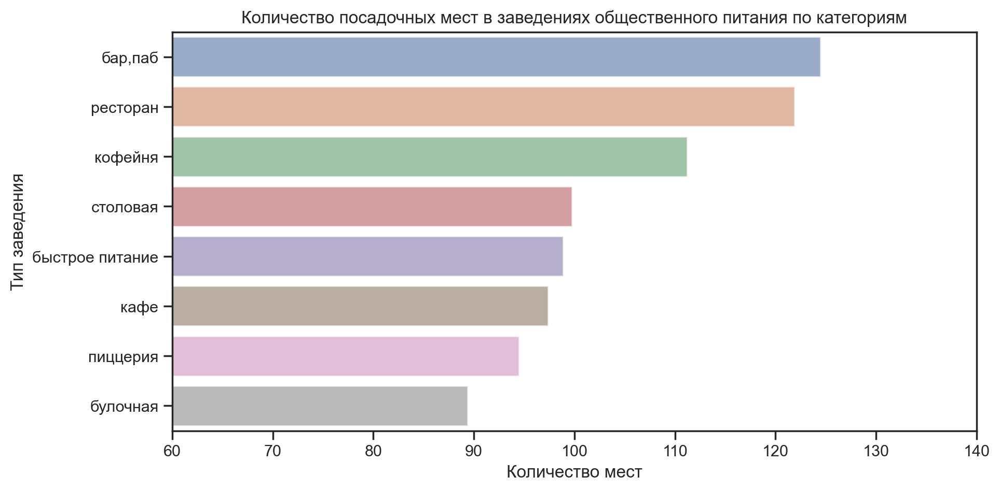

In [13]:
data_seats = (
    data
    .groupby('category', as_index=False)
    .agg(mean=('seats', 'mean'))
    .sort_values('mean', ascending=False)
)

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='mean', y='category', data=data_seats, alpha=0.6)
new_xticks = [60, 70, 80, 90, 100, 110, 120, 130, 140]
ax.set_xticks(new_xticks)
ax.set_xlim([min(new_xticks), max(new_xticks)])
ax.set_title('Количество посадочных мест в заведениях общественного питания по категориям')
ax.set_xlabel('Количество мест')
ax.set_ylabel('Тип заведения')
plt.show()

Лидерами по посадочным местам являются *Рестораны* и *Бары* - в среднем более 120 мест.\
При этом в таблице были указаны данные примерно у 50% заведений - это может сильно влиять на результат.

### Рассмотрим соотношение сетевых и несетевых заведений<a id="chain_ratio"></a> 

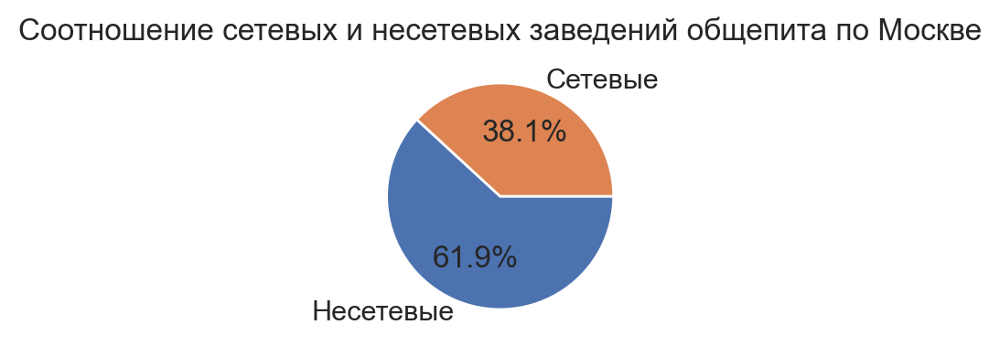

In [14]:
data_chain = (
    data
    .groupby('chain', as_index=False)
    .agg(count=('chain', 'count'))
)

plt.figure(figsize=(2, 3))
plt.pie(data_chain['count'],
        labels = data_chain['chain'].map({True: 'Сетевые', False: 'Несетевые'}), 
        autopct='%1.1f%%',
        counterclock=False)
plt.title('Соотношение сетевых и несетевых заведений общепита по Москве')
plt.show()

Больше по Москве несетевых заведений - 61,9% на 38,1% у сетевых общепитов.\
Посмотрим на соотношение "сетевые/несетевые" в разрезе типов заведений.

### Рассмотрим какие категории заведений чаще являются сетевыми<a id="percent_chain"></a> 

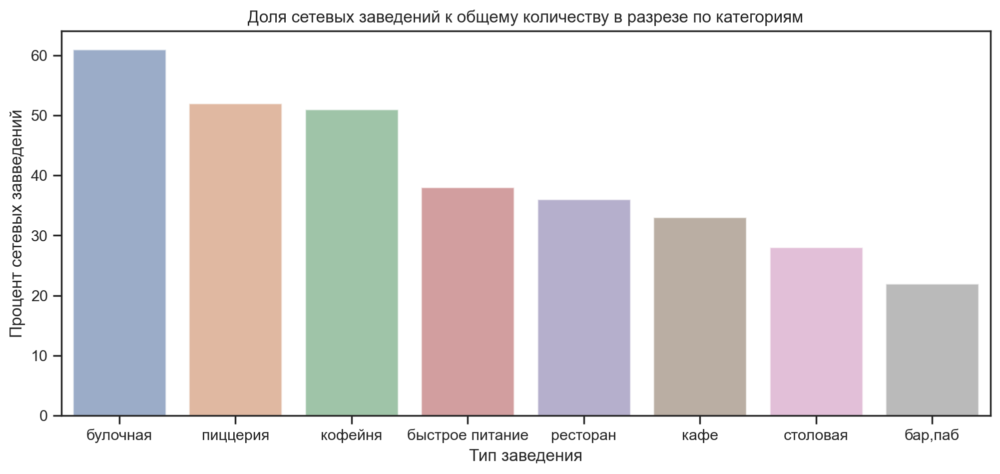

In [15]:
data_chain_category = (
    data
    .groupby('category', as_index=False)
    .agg({'chain': 'mean'})
    .sort_values(by='chain', ascending=False)
)

data_chain_category['chain'] = round(data_chain_category['chain'] * 100).astype(int)

plt.figure(figsize=(12, 5))
ax = sns.barplot(x='category', y='chain',
                 data=data_chain_category,
                 alpha=0.6)
ax.set_title('Доля сетевых заведений к общему количеству в разрезе по категориям')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Процент сетевых завведений')
plt.show()

В категориях *Кафе*, *Рестораны*, *Бары*, *Столовые* и *Быстрое питание* заметно больше несетевых заведений.\
В *Пицериях* и *Кофейнях* - паритет.\
Только в категории *Булочные* сетевые заведения на весомую долю вырвались вперёд.

### Найдём топ-15 популярных сетей в Москве<a id="top15_chain"></a> 

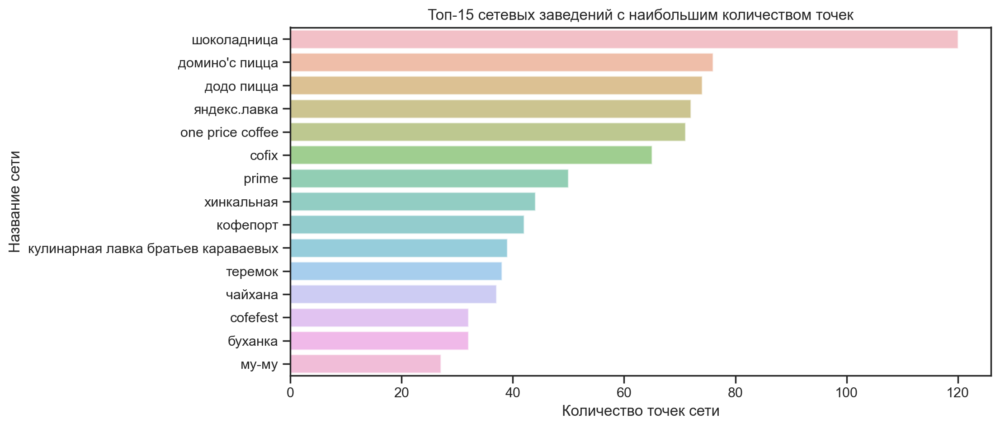

In [16]:
data_top_chain = (
    data.loc[data['chain']==True]
    .groupby(['name'], as_index = False)
    .agg(count=('category', 'count'))
    .sort_values('count', ascending=False)
    .head(15)
)

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='count', y='name', data=data_top_chain, alpha=0.6, )
ax.set_title('Топ-15 сетевых заведений с наибольшим количеством точек')
ax.set_xlabel('Количество точек сети')
ax.set_ylabel('Название сети')
plt.show()

Теперь посмотрим к каким категориям относятся сети в топ-15.

In [17]:
top_chain_category = (data.loc[data['name'].isin(data_top_chain['name'])]
             .groupby(['name', 'category'], as_index=False)
             .agg({'address': 'count'})
            )

fig = px.bar(top_chain_category, x='name', 
             y='address',
             color='category',
            title='Категории заведений в топ-15 сетях')
fig.update_layout(
    xaxis_title='',
    yaxis_title='Количество')
fig.show()

Видим, что есть сети, которые относятся только к одной определённой категории.\
А есть сети, у которых филиалы относятся к разным категориям заведений.

### Рассмотрим какие административные районы Москвы присутствуют в данных<a id="districts"></a> 

In [18]:
districts = data.groupby(['district', 'category'], as_index=False).agg({'name': 'count'})

district_all_fig = px.bar(districts.sort_values(by='name', ascending=False),
                x='district',
                y='name',
                barmode = 'stack',
                width=1000, height=700,
                color='category',
                title='Заведения Москвы по категориям и административным районам',
                labels={'district':'Названия районов', 'name':'Количество', 'category':'Категория заведений'})

district_all_fig.update_layout(
    barmode='stack', xaxis={'categoryorder':'total descending'},
    legend=dict(
        x=0.8,
        y=1,
        font=dict(
            size=10,
            color="black"
        ),
        bordercolor="lightblue",
        borderwidth=1
    )
)

district_all_fig.show()

Хоть количество заведений различается между районами Москвы, при этом соотношение категорий общепитов сохраняется.\
Единственное различие - в Центральном округе лидером среди категорий являются `Рестораны`, а в других районах города - `Кафе`.

### Исследуем распределение средних рейтингов по категориям заведений<a id="rating"></a> 

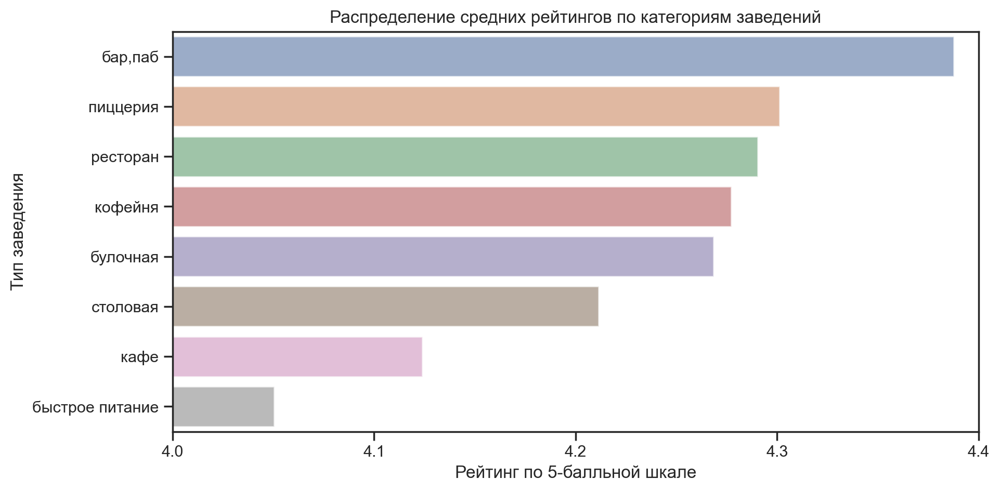

In [19]:
data_rating = (
    data
    .groupby(['category'], as_index = False)
    .agg(mean=('rating', 'mean'))
    .sort_values('mean', ascending=False)
)

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='mean', y='category', data=data_rating, alpha=0.6)
new_xticks = [4, 4.1, 4.2, 4.3, 4.4]
ax.set_xticks(new_xticks)
ax.set_xlim([min(new_xticks), max(new_xticks)])
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_xlabel('Рейтинг по 5-балльной шкале')
ax.set_ylabel('Тип заведения')
plt.show()

Самый высокий рейтинг у `Баров`, а самый низкий у `Быстрого питания`.\
Возможно высокие оценки в барах связаны с хорошими впечатлениями, когда плохие стрираются под действием алкогольных напитков.\
А в заведениях Быстрого питания, скорее всего, чаще можно получить некачественную еду.

### Построим фоновую картограмму со средним рейтингом заведений каждого района<a id="map_mean_rating"></a> 

In [20]:
import json

# загружаем JSON-файл с границами округов Москвы
with open('/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    state_geo = json.load(f)

In [21]:
from folium import Map, Choropleth

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

district_rating = data.groupby('district', as_index=False)['rating'].agg('mean')
district_rating = round(district_rating,2).sort_values(by='rating',ascending=False)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Центральный округ Москвы - ведущий рейтинг среди всех районов.

### Отобразим все заведения датасета на карте<a id="map_all_objects"></a> 

In [22]:
from folium import Marker
from folium.plugins import MarkerCluster

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

### Найдём топ-15 улиц по количеству заведений<a id="top_streets"></a> 

In [23]:
top_street = data.groupby('street', as_index=False).agg(count=('name', 'count'))
top_street = top_street.sort_values('count', ascending = False).reset_index().head(15)

data_street = data.groupby(['street', 'category'], as_index=False).agg(count=('name', 'count'))

top_15_street = data_street[data_street['street'].isin(top_street['street'])]


fig = px.bar(top_15_street.sort_values(by='count', ascending=True), 
             x='count',
             y='street',               
             color='category'
            )
fig.update_layout(title='Распределение количества заведений и их категорий по улицам',
                   xaxis_title='Количество',
                   yaxis_title='Улица',  
                   yaxis={'categoryorder':'total ascending'},
                   font=dict(size=15),
                   width=900, 
                   height=500
                 )
fig.show()

Больше всего заведений различных категорий на проспекте Мира, замыкает топ - Пятницкая улица.

### Найдём улицы, на которых находится только один объект общепита<a id="street_1"></a>

In [24]:
street_1=data.groupby(['street', 'district'], as_index = False)['name'].count().query('name==1')
len(street_1)

476

In [25]:
street_1['district'].value_counts()

Центральный административный округ         148
Северо-Восточный административный округ     56
Северный административный округ             53
Восточный административный округ            52
Южный административный округ                50
Юго-Восточный административный округ        42
Западный административный округ             36
Северо-Западный административный округ      21
Юго-Западный административный округ         18
Name: district, dtype: int64

В Центральном округе больше всего улиц с одним общепитом расположенным на них.

### Построим фоновую картограмму с медианным средним чеком для каждого района<a id="map_mean_bill"></a> 

In [26]:
prices = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)
prices

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [27]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=prices,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

m

### Вывод<a id="result"></a>

- В данных представлены заведения следующих категорий: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая'
- Больше всего заведений категорий "кафе", "кофейня", " ресторан"
- Больше всего посадочных мест в ресторанах, барах/пабах и кофейнях. Меньше всего мест в булочных
- Доля сетевых заведений составляет 38%, несетевых - 62%
- Чаще всего являются сетевыми заведениями - кафе, кофейни и рестораны
- Самые популярные сети в Москве - Шоколадница, Домино'с пицца, Додо Пицца, One Price Coffee, Яндекс Лавка
- Больше всего заведений расположены в Центральном административном округе  
- Самый высокий рейтинг у баров/пабов, пиццерий и ресторанов. Самый низкий - быстрое питание
- Выделили топ-15 улиц по количеству заведений. Лидером рейтинга является проспект Мира	
- Выявили 476 улиц с одним объектом общепита
- Максимальный средний чек в заведениях Центрального и Западного округа, демократичные цены в Юго-Восточном округе.

## Детализация исследования: открытие кофейни<a id="coffee_open"></a>

### Для начала выясним сколько кофеен в датасете<a id="count_coffee"></a> 

In [28]:
coffee = data.loc[data['category']=='кофейня']
len(coffee)

1413

1413 кофеен, узнаем, в каких районах их больше всего.

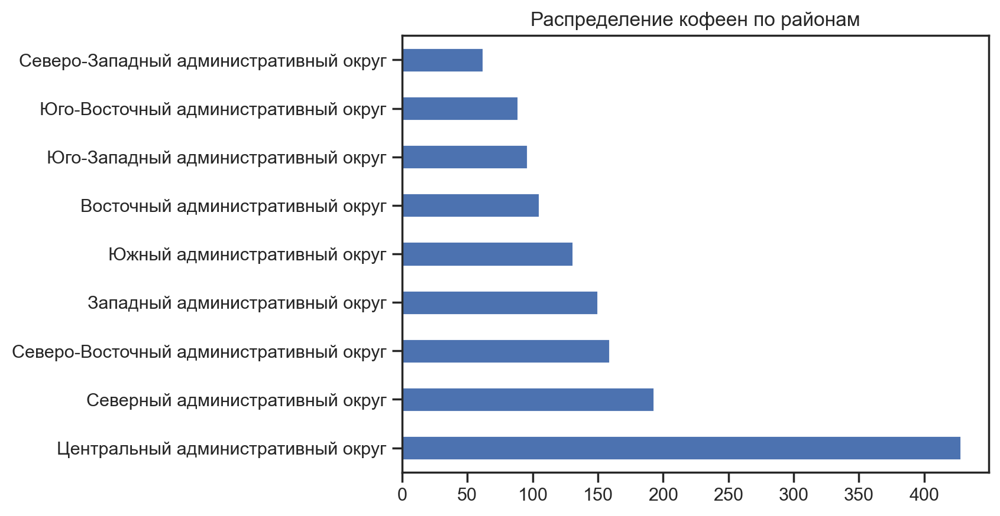

In [29]:
coffee_districts = coffee['district'].value_counts()
coffee_districts.plot(kind='barh', xlabel='', ylabel='', title='Распределение кофеен по районам')
plt.show()

Снова Центральный округ в лидерах по количеству заведений.\
Меньше всего кофеен в Северо-Западном административном округе.

### Есть ли круглосуточные кофейни?<a id="coffee_daynight"></a>

In [30]:
coffee_day_and_night = coffee[coffee['24/7']==True]
coffee_day_and_night.count()[0]

59

Всего по Москве 59 кофеен, куда можно зайти в любое время и в любой день недели.

### Узнаем распределение рейтингов по районам<a id="coffee_rating"></a>

In [31]:
coffee_rating = (
    coffee
    .pivot_table(index='district', values='rating', aggfunc='mean')
    .reset_index()
    .sort_values(by='rating', ascending=False)
    .reset_index(drop=True)
)

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

m

Самый низкий рейтинг в Западном административном округе, самый высокий - в Центральном.

### На какую стоимость чашки капучино стоит ориентироваться при открытии?<a id="coffee_cup"></a>

In [32]:
coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

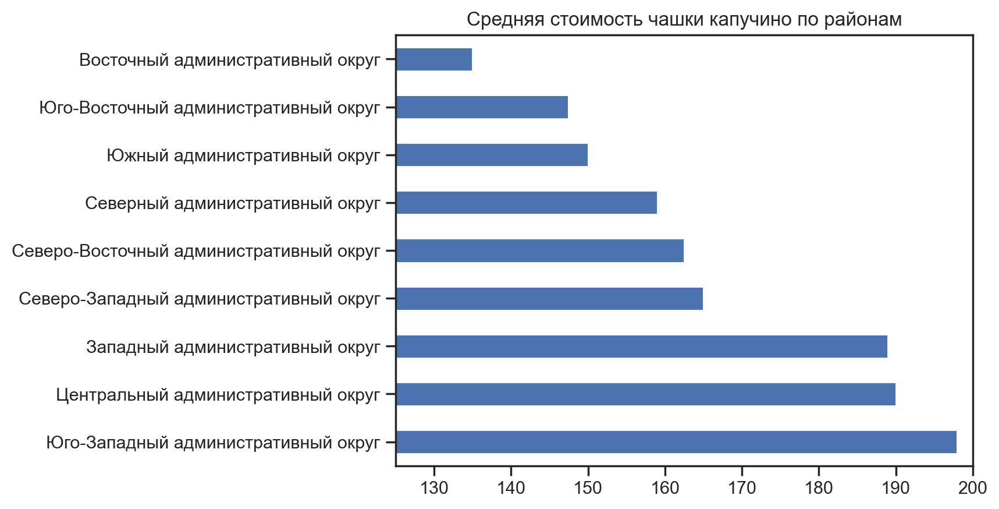

In [33]:
coffee_cost = coffee.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)
coffee_cost.plot(kind='barh', xlabel='', ylabel='', title='Средняя стоимость чашки капучино по районам')
plt.xlim([125, 200])
plt.show()

В Восточном административном округе чашка кофе дешевле, дороже всего в Юго-Западном, Западном и Центральном административных округах.

### Вывод<a id="coffee_result"></a>

В ходе исследования получили следующую информацию:
- всего по Москве 1413 кофеен, лишь 59 кофеен работают 24/7
- больше всего в Центральном округе, меньше всего кофеен открыто в Северо-Западном, Юго-Восточном, Юго-Западном и Восточном округах
- самый высокий рейтинг в Центральном административном округе, самый низкий - в Западном
- в среднем по Москве чашка капучино стоит 175 рублей, самая низкая стоимость в Юго-Восточном и Восточном округах - 135 рублей, самая высокая цена в Юго-Западном, Центральном и Западном округах от 189 до 198 рублей.

**Можно выделить такой округ как Юго-Западный**: малое количество открытых кофеен и самая высокая средняя стоимость чашки капучино по Москве.

**Также можно отметить Западный округ**: самый низкий рейтинг по Москве, среднее количество кофеен и высокая средняя стоимость чашки капучино по Москве.

**В этих округах есть возможность выставить цену за чашку капучино около 190-200 рублей, чему покупатели данных районов не будут удивлены.\
В Юго-Западном округе из-за малого количества точек будет меньше конкуренции.\
А в Западном округе из-за низкого рейтинга по Москве - есть хороший шанс выделиться среди других кофеен и занять свою нишу.**